# Flower Species Image Classification using Convolutional Neural Networks

**Module:** AI and Machine Learning  
**Task:** Vision Task – Image Classification with CNN  
**Name:** Srashta Shrestha  
**Student ID:** 2408582




## Section 1: Library Imports & GPU Setup

In [15]:
# Standard Library
import os
import time
import pathlib
import warnings
warnings.filterwarnings('ignore')

# Numerical & Visualization
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from PIL import Image

# Deep Learning (Keras / TensorFlow)
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, optimizers, callbacks, regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2          # chosen pre-trained model
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

# Evaluation Metrics
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

# Environment Info
print("TensorFlow version :", tf.__version__)
print("Keras version      :", keras.__version__)
gpus = tf.config.list_physical_devices('GPU')
print("GPU(s) detected    :", gpus if gpus else "None – using CPU")
print()

# Reproducibility seed
SEED = 7
np.random.seed(SEED)
tf.random.set_seed(SEED)
print("Global random seed set to:", SEED)

TensorFlow version : 2.20.0
Keras version      : 3.13.2
GPU(s) detected    : [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

Global random seed set to: 7



## Section 2: Dataset Loading & Path Configuration

The **Flowers Recognition** dataset contains 4,317 photographs across five flower species.

In [16]:
# Mount Google Drive (required when running on Google Colab)
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [17]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [18]:
# Auto-locate the dataset inside Google Drive
FLOWER_CLASSES = {'daisy', 'dandelion', 'rose', 'sunflower', 'tulip'}
drive_root = pathlib.Path('/content/drive/MyDrive/Colab Notebooks/Flower Classification')

detected_base = None
for candidate in drive_root.rglob('Train'):
    if candidate.is_dir():
        subdirs = {f.name for f in candidate.iterdir() if f.is_dir()}
        if subdirs & FLOWER_CLASSES:      # intersection – at least one class present
            detected_base = candidate.parent
            break

if detected_base:
    BASE_DIR  = detected_base
    print(f"Dataset found at  : {BASE_DIR}")
else:
    # Fallback: set path manually
    BASE_DIR  = drive_root / 'Flowers'
    print(f"Auto-detect failed. Defaulting to: {BASE_DIR}")
    print("Please update BASE_DIR manually if the path is wrong.")

TRAIN_DIR = BASE_DIR / 'Train'
TEST_DIR  = BASE_DIR / 'Test'

print(f"\nTraining directory : {TRAIN_DIR}")
print(f"Test directory     : {TEST_DIR}")
print(f"Classes inside Train: {sorted(os.listdir(TRAIN_DIR))}")

Dataset found at  : /content/drive/MyDrive/Colab Notebooks/Flower Classification

Training directory : /content/drive/MyDrive/Colab Notebooks/Flower Classification/Train
Test directory     : /content/drive/MyDrive/Colab Notebooks/Flower Classification/Test
Classes inside Train: ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']



## Section 3: Data Understanding, Analysis & Visualization

Before building any model, we must thoroughly understand the data. This section addresses:
- What the dataset represents
- Total image count and class distribution
- Image resolution variability
- Corrupted file detection and removal
- Visual inspection of representative samples

In [19]:
print("DATASET OVERVIEW")
print("""
Name    : Flowers Recognition
Task    : Multi-class Image Classification (5 classes)
Classes : Daisy, Dandelion, Rose, Sunflower, Tulip

Description:
  The dataset consists of real-world photographs of five flower species
  captured under diverse lighting conditions, backgrounds (grass, sky,
  gravel), orientations, and camera distances. Images vary considerably
  in resolution and aspect ratio, making it a realistic and challenging
  classification benchmark. The key inter-class challenge is visual
  similarity: dandelions and sunflowers share a yellow radial appearance,
  while certain rose and tulip cultivars have overlapping color profiles.
""")

DATASET OVERVIEW

Name    : Flowers Recognition
Task    : Multi-class Image Classification (5 classes)
Classes : Daisy, Dandelion, Rose, Sunflower, Tulip

Description:
  The dataset consists of real-world photographs of five flower species
  captured under diverse lighting conditions, backgrounds (grass, sky,
  gravel), orientations, and camera distances. Images vary considerably
  in resolution and aspect ratio, making it a realistic and challenging
  classification benchmark. The key inter-class challenge is visual
  similarity: dandelions and sunflowers share a yellow radial appearance,
  while certain rose and tulip cultivars have overlapping color profiles.



In [20]:
# Audit each class: count valid images and remove corrupted ones
class_names   = sorted([p.name for p in TRAIN_DIR.iterdir() if p.is_dir()])
class_counts  = {}
corrupt_counts = {}

print("Scanning dataset for valid / corrupted images...\n")
for cls in class_names:
    cls_dir = TRAIN_DIR / cls
    valid = 0
    corrupt = 0
    for img_path in cls_dir.iterdir():
        if not img_path.is_file():
            continue
        try:
            with Image.open(img_path) as img:
                img.verify()        # raises if file is corrupt
            valid += 1
        except Exception:
            corrupt += 1
            img_path.unlink()       # remove the bad file
    class_counts[cls]   = valid
    corrupt_counts[cls] = corrupt
    print(f"  {cls:<12}: {valid:>4} valid  |  {corrupt} corrupted (removed)")

total_images   = sum(class_counts.values())
total_corrupt  = sum(corrupt_counts.values())

print(f"  Total usable images : {total_images}")
print(f"  Total removed       : {total_corrupt}")
print(f"  Number of classes   : {len(class_names)}")

Scanning dataset for valid / corrupted images...

  daisy       :  756 valid  |  0 corrupted (removed)
  dandelion   : 1044 valid  |  0 corrupted (removed)
  rose        :  776 valid  |  0 corrupted (removed)
  sunflower   :  725 valid  |  0 corrupted (removed)
  tulip       :  976 valid  |  0 corrupted (removed)
  Total usable images : 4277
  Total removed       : 0
  Number of classes   : 5


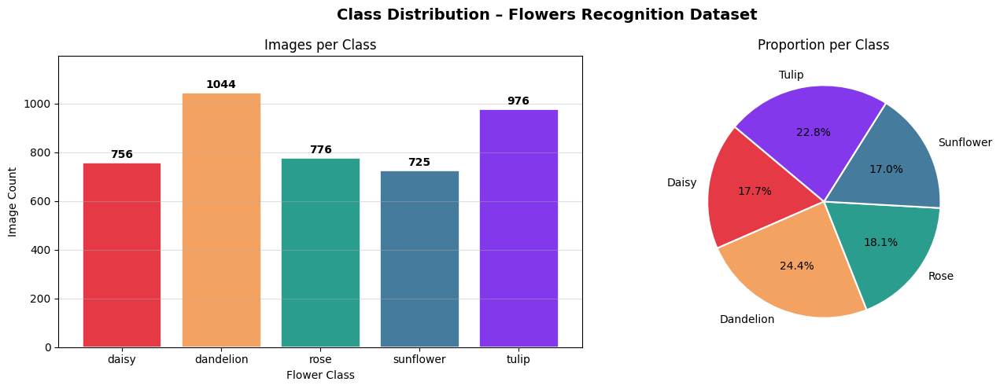

Largest class  : dandelion (1044 images)
Smallest class : sunflower (725 images)
Imbalance ratio: 1.44

Observation: The dataset has a mild class imbalance (ratio < 2.0).
This is not severe enough to require resampling, but we will track
weighted F1-score alongside accuracy to avoid a misleadingly high accuracy.


In [21]:
# Class Distribution Bar Chart
PALETTE = ['#E63946', '#F4A261', '#2A9D8F', '#457B9D', '#8338EC']

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Class Distribution – Flowers Recognition Dataset', fontsize=14, fontweight='bold')

# Bar chart
bars = axes[0].bar(class_counts.keys(), class_counts.values(), color=PALETTE, edgecolor='white', linewidth=1.2)
axes[0].set_xlabel('Flower Class')
axes[0].set_ylabel('Image Count')
axes[0].set_title('Images per Class')
axes[0].set_ylim(0, max(class_counts.values()) + 150)
for bar, count in zip(bars, class_counts.values()):
    axes[0].text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 20,
        str(count), ha='center', fontweight='bold', fontsize=10
    )
axes[0].grid(axis='y', alpha=0.4)

# Pie chart
axes[1].pie(
    class_counts.values(),
    labels=[c.capitalize() for c in class_counts.keys()],
    colors=PALETTE,
    autopct='%1.1f%%',
    startangle=140,
    wedgeprops={'edgecolor': 'white', 'linewidth': 1.5}
)
axes[1].set_title('Proportion per Class')

plt.tight_layout()
plt.show()

# Imbalance ratio
max_cls, max_n = max(class_counts.items(), key=lambda x: x[1])
min_cls, min_n = min(class_counts.items(), key=lambda x: x[1])
ratio = max_n / min_n
print(f"Largest class  : {max_cls} ({max_n} images)")
print(f"Smallest class : {min_cls} ({min_n} images)")
print(f"Imbalance ratio: {ratio:.2f}")
print()
print("Observation: The dataset has a mild class imbalance (ratio < 2.0).")
print("This is not severe enough to require resampling, but we will track")
print("weighted F1-score alongside accuracy to avoid a misleadingly high accuracy.")

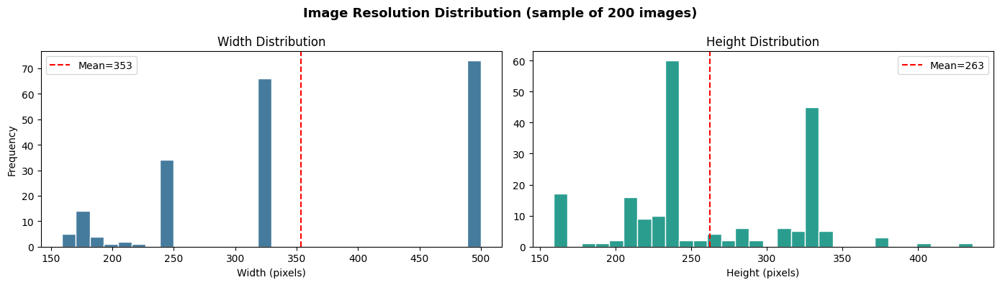

Width  – min: 159, max: 500, mean: 353
Height – min: 159, max: 436, mean: 263

Conclusion: Images vary widely in resolution.
→ We will resize all images to 224×224 for our scratch-built CNNs.
→ We will use 224×224 for MobileNetV2 (Part B) to match ImageNet input requirements.


In [22]:
# Resolution Variability Audit
# Sample up to 40 images per class to inspect width/height distributions
widths, heights = [], []

for cls in class_names:
    cls_dir = TRAIN_DIR / cls
    sample  = list(cls_dir.glob('*.jpg'))[:40]
    for img_path in sample:
        try:
            with Image.open(img_path) as img:
                w, h = img.size
                widths.append(w)
                heights.append(h)
        except Exception:
            pass

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
fig.suptitle('Image Resolution Distribution (sample of 200 images)', fontsize=13, fontweight='bold')

axes[0].hist(widths,  bins=30, color='#457B9D', edgecolor='white')
axes[0].set_xlabel('Width (pixels)')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Width Distribution')
axes[0].axvline(np.mean(widths),  color='red', linestyle='--', label=f'Mean={np.mean(widths):.0f}')
axes[0].legend()

axes[1].hist(heights, bins=30, color='#2A9D8F', edgecolor='white')
axes[1].set_xlabel('Height (pixels)')
axes[1].set_title('Height Distribution')
axes[1].axvline(np.mean(heights), color='red', linestyle='--', label=f'Mean={np.mean(heights):.0f}')
axes[1].legend()

plt.tight_layout()
plt.show()

print(f"Width  – min: {min(widths)}, max: {max(widths)}, mean: {np.mean(widths):.0f}")
print(f"Height – min: {min(heights)}, max: {max(heights)}, mean: {np.mean(heights):.0f}")
print()
print("Conclusion: Images vary widely in resolution.")
print("→ We will resize all images to 224×224 for our scratch-built CNNs.")
print("→ We will use 224×224 for MobileNetV2 (Part B) to match ImageNet input requirements.")

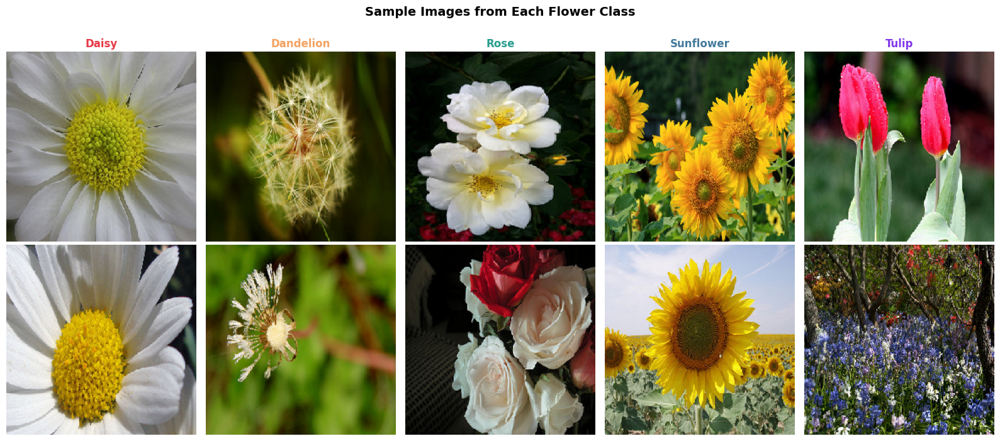


Visual Observations:
  • Daisy      – white petals with yellow center; relatively compact form
  • Dandelion  – bright yellow/white spherical heads; highly variable background
  • Rose       – range of colors (red, pink, white); petals tightly layered
  • Sunflower  – large yellow petals with dark centre; can resemble dandelion
  • Tulip      – cup-shaped; solid colors; sometimes confused with rose

  Key challenges: dandelion vs. sunflower (both yellow), rose vs. tulip (both cup-shaped).
  Background clutter (grass, sky, foliage) may introduce misleading spatial features.



In [23]:
# Visual Inspection: 2 sample images per class
SAMPLES_PER_CLASS = 2
n_classes = len(class_names)

fig, axes = plt.subplots(SAMPLES_PER_CLASS, n_classes, figsize=(16, 7))
fig.suptitle('Sample Images from Each Flower Class', fontsize=14, fontweight='bold', y=1.01)

for col, cls in enumerate(class_names):
    cls_dir = TRAIN_DIR / cls
    imgs    = sorted(cls_dir.glob('*.jpg'))[:SAMPLES_PER_CLASS]
    for row, img_path in enumerate(imgs):
        img = keras.preprocessing.image.load_img(img_path, target_size=(224, 224))
        axes[row, col].imshow(img)
        axes[row, col].axis('off')
        if row == 0:
            axes[row, col].set_title(cls.capitalize(), fontsize=12, fontweight='bold', color=PALETTE[col])

plt.tight_layout()
plt.show()

print("""
Visual Observations:
  • Daisy      – white petals with yellow center; relatively compact form
  • Dandelion  – bright yellow/white spherical heads; highly variable background
  • Rose       – range of colors (red, pink, white); petals tightly layered
  • Sunflower  – large yellow petals with dark centre; can resemble dandelion
  • Tulip      – cup-shaped; solid colors; sometimes confused with rose

  Key challenges: dandelion vs. sunflower (both yellow), rose vs. tulip (both cup-shaped).
  Background clutter (grass, sky, foliage) may introduce misleading spatial features.
""")

## Section 4: Data Preprocessing & Augmentation


In [24]:
# Global constants
IMG_SIZE_SCRATCH  = (224, 224)   # for Part A scratch models
IMG_SIZE_TRANSFER = (224, 224)   # for Part B MobileNetV2
BATCH_SIZE        = 32

# Data generators for Part A (scratch CNNs)
train_datagen = ImageDataGenerator(
    rescale            = 1.0 / 255.0,
    rotation_range     = 30,          # flowers appear at any angle
    width_shift_range  = 0.15,
    height_shift_range = 0.15,
    shear_range        = 0.15,
    zoom_range         = 0.25,        # handle different camera distances
    horizontal_flip    = True,
    vertical_flip      = False,       # flowers don't naturally appear upside-down
    brightness_range   = [0.8, 1.2],  # simulate different lighting
    fill_mode          = 'nearest',
    validation_split   = 0.20
)

# Validation generator – rescale only (no augmentation)
val_datagen = ImageDataGenerator(
    rescale          = 1.0 / 255.0,
    validation_split = 0.20
)

train_gen = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size  = IMG_SIZE_SCRATCH,
    batch_size   = BATCH_SIZE,
    class_mode   = 'categorical',
    subset       = 'training',
    seed         = SEED,
    shuffle      = True
)

val_gen = val_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size  = IMG_SIZE_SCRATCH,
    batch_size   = BATCH_SIZE,
    class_mode   = 'categorical',
    subset       = 'validation',
    seed         = SEED,
    shuffle      = False
)

CLASS_LABELS = list(train_gen.class_indices.keys())
NUM_CLASSES  = len(CLASS_LABELS)

print(f"Training   samples : {train_gen.samples}")
print(f"Validation samples : {val_gen.samples}")
print(f"Class index mapping: {train_gen.class_indices}")
print(f"Batch shape        : {next(train_gen)[0].shape}")

Found 3423 images belonging to 5 classes.
Found 854 images belonging to 5 classes.
Training   samples : 3423
Validation samples : 854
Class index mapping: {'daisy': 0, 'dandelion': 1, 'rose': 2, 'sunflower': 3, 'tulip': 4}
Batch shape        : (32, 224, 224, 3)


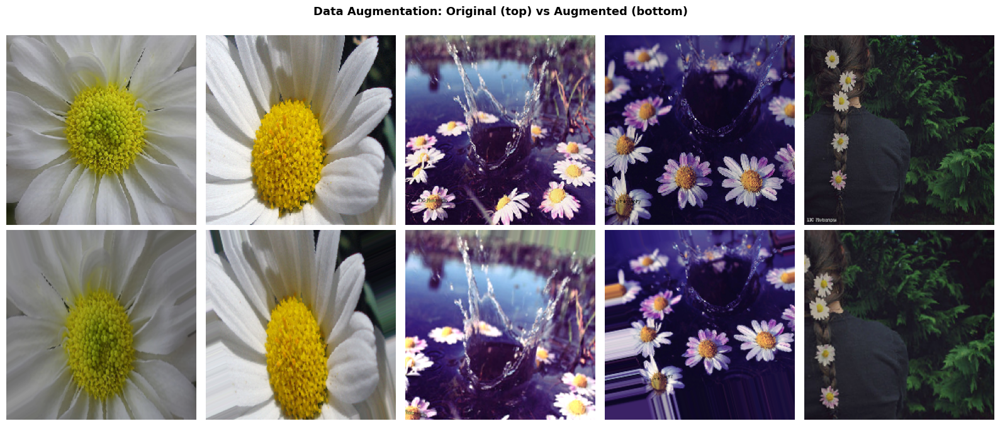


Augmentation justification:
  rotation_range=30    – flowers can be photographed at any angle
  width/height shift   – subject may not be perfectly centred
  zoom_range=0.25      – camera distances vary considerably
  horizontal_flip      – left-right symmetry exists in most flowers
  brightness_range     – outdoor lighting varies throughout the day
  No vertical_flip     – flowers typically grow upright



In [25]:
# Visualise augmented images
# Re-initialise generator pointed at a single class so we can compare
# original vs augmented side-by-side
orig_gen = ImageDataGenerator(rescale=1.0/255.0)
aug_gen  = ImageDataGenerator(
    rescale=1.0/255.0,
    rotation_range=30, width_shift_range=0.15, height_shift_range=0.15,
    zoom_range=0.25, horizontal_flip=True, brightness_range=[0.8,1.2], fill_mode='nearest'
)

# Pick 5 images from daisy to illustrate augmentation
sample_dir  = TRAIN_DIR / 'daisy'
sample_imgs = sorted(sample_dir.glob('*.jpg'))[:5]

fig, axes = plt.subplots(2, 5, figsize=(16, 7))
fig.suptitle('Data Augmentation: Original (top) vs Augmented (bottom)', fontsize=13, fontweight='bold')

for col, img_path in enumerate(sample_imgs):
    arr = keras.preprocessing.image.img_to_array(
              keras.preprocessing.image.load_img(img_path, target_size=IMG_SIZE_SCRATCH)
          )
    arr = arr[np.newaxis, ...]          # add batch dimension

    # Original
    axes[0, col].imshow(arr[0]/ 255.0)
    axes[0, col].axis('off')
    if col == 0:
        axes[0, col].set_ylabel('Original', fontsize=10)

    # Augmented (one random transformation)
    aug_img = next(aug_gen.flow(arr, batch_size=1))[0]
    axes[1, col].imshow(aug_img)
    axes[1, col].axis('off')
    if col == 0:
        axes[1, col].set_ylabel('Augmented', fontsize=10)

plt.tight_layout()
plt.show()

print("""
Augmentation justification:
  rotation_range=30    – flowers can be photographed at any angle
  width/height shift   – subject may not be perfectly centred
  zoom_range=0.25      – camera distances vary considerably
  horizontal_flip      – left-right symmetry exists in most flowers
  brightness_range     – outdoor lighting varies throughout the day
  No vertical_flip     – flowers typically grow upright
""")

## Section 5 – Part A: Baseline CNN (3 Convolutional Layers)

### Architecture design

The baseline follows the specification exactly: three convolutional layers each followed by a pooling layer, three fully connected layers, and a softmax output. No regularisation is applied at this stage — this is the intentional control model against which deeper architectures will be measured.


In [26]:
def build_baseline_cnn(input_shape=(224, 224, 3), num_classes=5):
    """
    Baseline CNN:
      - 3 Convolutional blocks (Conv2D → MaxPool2D)
      - 3 Fully connected layers
      - Softmax output
    No regularisation layers are included (intentional baseline control).
    """
    model = models.Sequential(name='Baseline_CNN')

    # Convolutional Block 1
    # 32 filters, 3×3 kernel – learn low-level features (edges, colour blobs)
    model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape,
                            padding='valid', name='conv1'))
    model.add(layers.MaxPooling2D((2, 2), name='pool1'))

    # Convolutional Block 2
    # 64 filters – learn mid-level features (petals, leaf shapes)
    model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='valid', name='conv2'))
    model.add(layers.MaxPooling2D((2, 2), name='pool2'))

    # Convolutional Block 3
    # 128 filters – learn higher-level patterns (flower centres, petal arrangement)
    model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='valid', name='conv3'))
    model.add(layers.MaxPooling2D((2, 2), name='pool3'))

    # Classifier Head
    model.add(layers.Flatten(name='flatten'))

    # Three fully connected layers as required by the specification
    model.add(layers.Dense(256, activation='relu', name='fc1'))
    model.add(layers.Dense(128, activation='relu', name='fc2'))
    model.add(layers.Dense(64,  activation='relu', name='fc3'))

    # Softmax output – categorical probability for each of the 5 classes
    model.add(layers.Dense(num_classes, activation='softmax', name='output'))

    return model


baseline_model = build_baseline_cnn()
baseline_model.summary()

print("""
Architecture Interpretation:
  • Total parameters indicate model capacity.
  • Most parameters concentrate in the FC layers because the flattened
    feature map is still large (no aggressive pooling).
  • 3×3 kernels are the standard choice: they capture local spatial
    patterns efficiently and are computationally cheaper than larger kernels.
  • Filter doubling (32→64→128) is a common heuristic: each block learns
    more abstract, higher-dimensional feature representations.
""")

Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1 (Conv2D)                  │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2 (Conv2D)                  │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3 (Conv2D)                  │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool3 (MaxPooling2D)            │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 256)            │    22,151,424 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc3 (Dense)                     │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 5)              │           325 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 22,286,149 (85.01 MB)

 Trainable params: 22,286,149 (85.01 MB)

 Non-trainable params: 0 (0.00 B)


Architecture Interpretation:
  • Total parameters indicate model capacity.
  • Most parameters concentrate in the FC layers because the flattened
    feature map is still large (no aggressive pooling).
  • 3×3 kernels are the standard choice: they capture local spatial
    patterns efficiently and are computationally cheaper than larger kernels.
  • Filter doubling (32→64→128) is a common heuristic: each block learns
    more abstract, higher-dimensional feature representations.



In [27]:
# Compile
baseline_model.compile(
    optimizer = optimizers.Adam(learning_rate=0.001),
    loss      = 'categorical_crossentropy',
    metrics   = ['accuracy']
)

# Callbacks
baseline_callbacks = [
    callbacks.EarlyStopping(
        monitor='val_loss', patience=6,
        restore_best_weights=True, verbose=1
    ),
    callbacks.ReduceLROnPlateau(
        monitor='val_loss', factor=0.5,
        patience=3, min_lr=1e-7, verbose=1
    )
]

# Training
EPOCHS_BASELINE = 30

print(f"Training Baseline CNN for up to {EPOCHS_BASELINE} epochs...")
print(f"Early stopping patience = 6 | LR reduction patience = 3")
print()

t0 = time.time()
baseline_hist = baseline_model.fit(
    train_gen,
    epochs          = EPOCHS_BASELINE,
    validation_data = val_gen,
    callbacks       = baseline_callbacks,
    verbose         = 1
)
baseline_time = time.time() - t0

print(f"\nBaseline training complete. Total time: {baseline_time:.1f}s ({baseline_time/60:.1f} min)")

Training Baseline CNN for up to 30 epochs...
Early stopping patience = 6 | LR reduction patience = 3

Epoch 1/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 84s 742ms/step - accuracy: 0.3842 - loss: 1.3886 - val_accuracy: 0.4461 - val_loss: 1.2325 - learning_rate: 0.0010
Epoch 2/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 68s 639ms/step - accuracy: 0.4779 - loss: 1.1756 - val_accuracy: 0.5703 - val_loss: 1.0600 - learning_rate: 0.0010
Epoch 3/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 80s 621ms/step - accuracy: 0.5691 - loss: 1.0562 - val_accuracy: 0.6019 - val_loss: 0.9998 - learning_rate: 0.0010
Epoch 4/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 68s 636ms/step - accuracy: 0.6074 - loss: 0.9862 - val_accuracy: 0.6417 - val_loss: 0.9253 - learning_rate: 0.0010
Epoch 5/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 68s 636ms/step - accuracy: 0.6345 - loss: 0.9429 - val_accuracy: 0.6780 - val_loss: 0.8657 - learning_rate: 0.0010
Epoch 6/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 68s 636ms/step - accuracy: 0.6544 - loss: 0.8961 - val_accuracy: 0.6815 - val_loss:

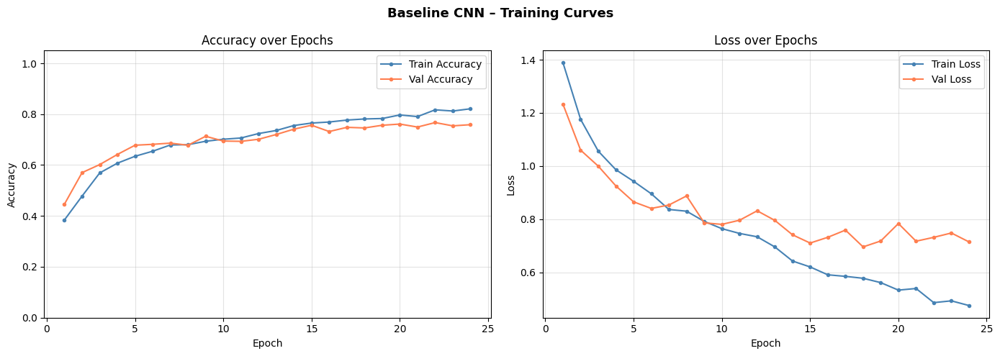

In [28]:
# Reusable plotting function
def plot_history(history, title='Model', figsize=(14, 5)):
    """
    Plot training vs validation accuracy and loss curves.
    Highlights the epoch at which training stopped.
    """
    acc      = history.history['accuracy']
    val_acc  = history.history['val_accuracy']
    loss     = history.history['loss']
    val_loss = history.history['val_loss']
    epochs   = range(1, len(acc) + 1)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    fig.suptitle(f'{title} – Training Curves', fontsize=13, fontweight='bold')

    # Accuracy
    ax1.plot(epochs, acc,     label='Train Accuracy', color='steelblue', marker='.')
    ax1.plot(epochs, val_acc, label='Val Accuracy',   color='coral',     marker='.')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Accuracy')
    ax1.set_title('Accuracy over Epochs')
    ax1.legend()
    ax1.grid(True, alpha=0.35)
    ax1.set_ylim(0, 1.05)

    # Loss
    ax2.plot(epochs, loss,     label='Train Loss', color='steelblue', marker='.')
    ax2.plot(epochs, val_loss, label='Val Loss',   color='coral',     marker='.')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Loss')
    ax2.set_title('Loss over Epochs')
    ax2.legend()
    ax2.grid(True, alpha=0.35)

    plt.tight_layout()
    plt.show()


plot_history(baseline_hist, title='Baseline CNN')

  Baseline CNN  –  Evaluation Results
              precision    recall  f1-score   support

       daisy     0.8760    0.7020    0.7794       151
   dandelion     0.7566    0.8221    0.7880       208
        rose     0.6364    0.5871    0.6107       155
   sunflower     0.7742    0.8276    0.8000       145
       tulip     0.7129    0.7641    0.7376       195

    accuracy                         0.7459       854
   macro avg     0.7512    0.7406    0.7432       854
weighted avg     0.7489    0.7459    0.7448       854

Weighted Accuracy  : 0.7459
Weighted Precision : 0.7489
Weighted Recall    : 0.7459
Weighted F1-Score  : 0.7448


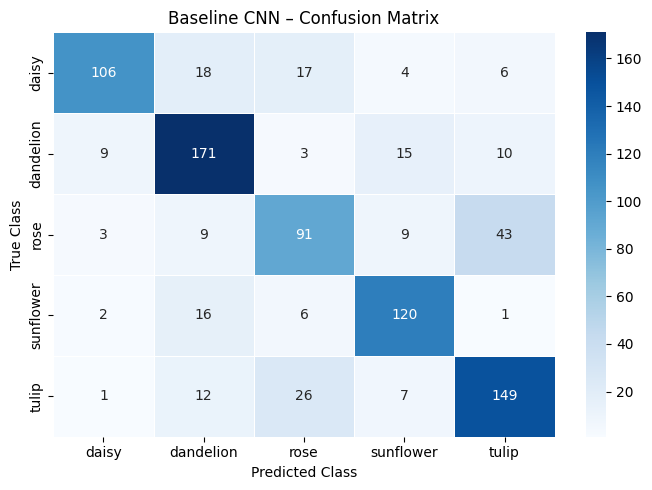

In [29]:
# Reusable evaluation function
def evaluate_model(model, generator, model_name='Model'):
    """
    Evaluates model on a given generator.
    Returns dict of {accuracy, precision, recall, f1}.
    Prints classification report and confusion matrix.
    """
    generator.reset()
    probs  = model.predict(generator, verbose=0)
    y_pred = np.argmax(probs, axis=1)
    y_true = generator.classes
    labels = list(generator.class_indices.keys())

    print(f"  {model_name}  –  Evaluation Results")
    print(classification_report(y_true, y_pred, target_names=labels, digits=4))

    acc  = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, average='weighted', zero_division=0)
    rec  = recall_score(y_true, y_pred, average='weighted')
    f1   = f1_score(y_true, y_pred, average='weighted')

    print(f"Weighted Accuracy  : {acc:.4f}")
    print(f"Weighted Precision : {prec:.4f}")
    print(f"Weighted Recall    : {rec:.4f}")
    print(f"Weighted F1-Score  : {f1:.4f}")

    # Confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(7, 5))
    sns.heatmap(
        cm, annot=True, fmt='d', cmap='Blues',
        xticklabels=labels, yticklabels=labels,
        linewidths=0.5
    )
    plt.title(f'{model_name} – Confusion Matrix')
    plt.xlabel('Predicted Class')
    plt.ylabel('True Class')
    plt.tight_layout()
    plt.show()

    return {'accuracy': acc, 'precision': prec, 'recall': rec, 'f1': f1}


baseline_metrics = evaluate_model(baseline_model, val_gen, 'Baseline CNN')

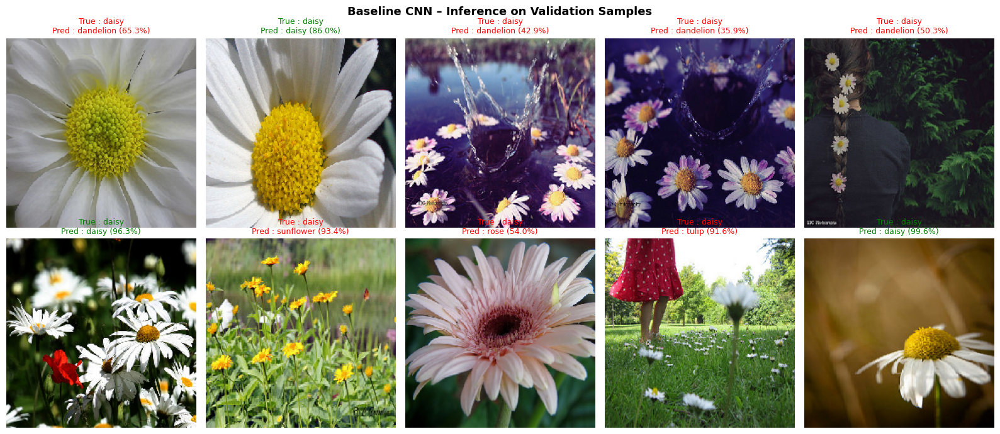


Baseline CNN – Key Observations:
  • Without regularisation the model tends to overfit after ~10–15 epochs
    (widening gap between training and validation loss).
  • Confusion is most common between dandelion↔sunflower and rose↔tulip,
    consistent with the visual similarity noted during EDA.
  • The relatively shallow architecture may lack capacity to disambiguate
    subtle textural differences between similar classes.



In [30]:
# Reusable inference visualisation
def show_predictions(model, generator, model_name='Model', n=10):
    """
    Display n sample images with true vs predicted labels.
    Correct predictions shown in green; errors in red.
    """
    generator.reset()
    imgs, labels_ohe = next(generator)
    preds   = model.predict(imgs, verbose=0)
    labels  = list(generator.class_indices.keys())

    n    = min(n, len(imgs))
    cols = 5
    rows = (n + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(16, rows * 3.5))
    axes      = axes.flatten()
    fig.suptitle(f'{model_name} – Inference on Validation Samples', fontsize=13, fontweight='bold')

    for i in range(n):
        axes[i].imshow(np.clip(imgs[i], 0, 1))
        true_lbl = labels[np.argmax(labels_ohe[i])]
        pred_lbl = labels[np.argmax(preds[i])]
        conf     = np.max(preds[i]) * 100
        colour   = 'green' if true_lbl == pred_lbl else 'red'
        axes[i].set_title(f'True : {true_lbl}\nPred : {pred_lbl} ({conf:.1f}%)',
                          color=colour, fontsize=9)
        axes[i].axis('off')

    for j in range(n, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()


show_predictions(baseline_model, val_gen, 'Baseline CNN', n=10)

print("""
Baseline CNN – Key Observations:
  • Without regularisation the model tends to overfit after ~10–15 epochs
    (widening gap between training and validation loss).
  • Confusion is most common between dandelion↔sunflower and rose↔tulip,
    consistent with the visual similarity noted during EDA.
  • The relatively shallow architecture may lack capacity to disambiguate
    subtle textural differences between similar classes.
""")

## Section 6 – Part A: Deeper CNN with Regularisation (6 Convolutional Layers)

The deeper model doubles the number of convolutional layers compared to the baseline and introduces two regularisation techniques:

1. **Batch Normalisation** – normalises activations within each mini-batch, stabilising training and allowing higher learning rates.
2. **Dropout** – randomly zeros a fraction of neurons during training, forcing the network to learn redundant representations and preventing co-adaptation.

Additionally, **padding='same'** is used so that spatial dimensions are preserved through each convolution, only reduced by the pooling layers — giving the deeper stacks room to operate.

In [31]:
def build_deeper_cnn(input_shape=(224, 224, 3), num_classes=5, optimizer_name='adam'):
    """
    Deeper CNN with 6 convolutional layers (doubled from baseline),
    Batch Normalisation, and Dropout regularisation.

    Blocks:
      Block 1: Conv(32) → BN → Conv(32) → BN → MaxPool → Dropout(0.25)
      Block 2: Conv(64) → BN → Conv(64) → BN → MaxPool → Dropout(0.25)
      Block 3: Conv(128)→ BN → Conv(128)→ BN → MaxPool → Dropout(0.25)
      Dense:   FC(512) → BN → Dropout(0.50)
               FC(256) → BN → Dropout(0.50)
               FC(128) → Dropout(0.50)
               Softmax(5)
    """
    model = models.Sequential(name=f'Deeper_CNN_{optimizer_name}')

    # Block 1: 2× Conv(32)
    model.add(layers.Conv2D(32, (3,3), activation='relu', padding='same',
                            input_shape=input_shape, name='b1_conv1'))
    model.add(layers.BatchNormalization(name='b1_bn1'))
    model.add(layers.Conv2D(32, (3,3), activation='relu', padding='same', name='b1_conv2'))
    model.add(layers.BatchNormalization(name='b1_bn2'))
    model.add(layers.MaxPooling2D((2,2), name='b1_pool'))
    model.add(layers.Dropout(0.25, name='b1_drop'))

    # Block 2: 2× Conv(64)
    model.add(layers.Conv2D(64, (3,3), activation='relu', padding='same', name='b2_conv1'))
    model.add(layers.BatchNormalization(name='b2_bn1'))
    model.add(layers.Conv2D(64, (3,3), activation='relu', padding='same', name='b2_conv2'))
    model.add(layers.BatchNormalization(name='b2_bn2'))
    model.add(layers.MaxPooling2D((2,2), name='b2_pool'))
    model.add(layers.Dropout(0.25, name='b2_drop'))

    # Block 3: 2× Conv(128)
    model.add(layers.Conv2D(128, (3,3), activation='relu', padding='same', name='b3_conv1'))
    model.add(layers.BatchNormalization(name='b3_bn1'))
    model.add(layers.Conv2D(128, (3,3), activation='relu', padding='same', name='b3_conv2'))
    model.add(layers.BatchNormalization(name='b3_bn2'))
    model.add(layers.MaxPooling2D((2,2), name='b3_pool'))
    model.add(layers.Dropout(0.25, name='b3_drop'))

    # Classifier Head
    model.add(layers.Flatten(name='flatten'))

    model.add(layers.Dense(512, activation='relu', name='fc1'))
    model.add(layers.BatchNormalization(name='fc1_bn'))
    model.add(layers.Dropout(0.50, name='fc1_drop'))

    model.add(layers.Dense(256, activation='relu', name='fc2'))
    model.add(layers.BatchNormalization(name='fc2_bn'))
    model.add(layers.Dropout(0.50, name='fc2_drop'))

    model.add(layers.Dense(128, activation='relu', name='fc3'))
    model.add(layers.Dropout(0.50, name='fc3_drop'))

    model.add(layers.Dense(num_classes, activation='softmax', name='output'))

    return model


deeper_model_adam = build_deeper_cnn(optimizer_name='adam')
deeper_model_adam.summary()

print("""
Deeper CNN – Architecture Notes:
  • 6 convolutional layers (vs 3 in baseline) → double the depth.
  • Batch Normalisation after every Conv: stabilises gradients, acts as
    mild regulariser, and often allows faster convergence.
  • Dropout(0.25) after pooling: drops 25% of feature-map activations,
    reducing spatial co-adaptation.
  • Dropout(0.50) in dense layers: aggressive regularisation where the
    risk of memorisation is highest.
  • padding='same' keeps spatial resolution consistent within each block.
""")

Model: "Deeper_CNN_adam"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ b1_conv1 (Conv2D)               │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ b1_bn1 (BatchNormalization)     │ (None, 224, 224, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ b1_conv2 (Conv2D)               │ (None, 224, 224, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ b1_bn2 (BatchNormalization)     │ (None, 224, 224, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ b1_pool (MaxPooling2D)          │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ b1_drop (Dropout)               │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ b2_conv1 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ b2_bn1 (BatchNormalization)     │ (None, 112, 112, 64)   │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ b2_conv2 (Conv2D)               │ (None, 112, 112, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ b2_bn2 (BatchNormalization)     │ (None, 112, 112, 64)   │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ b2_pool (MaxPooling2D)          │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ b2_drop (Dropout)               │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ b3_conv1 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ b3_bn1 (BatchNormalization)     │ (None, 56, 56, 128)    │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ b3_conv2 (Conv2D)               │ (None, 56, 56, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ b3_bn2 (BatchNormalization)     │ (None, 56, 56, 128)    │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ b3_pool (MaxPooling2D)          │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ b3_drop (Dropout)               │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 100352)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 512)            │    51,380,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1_bn (BatchNormalization)     │ (None, 512)            │         2,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1_drop (Dropout)              │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2_bn (BatchNormalization)     │ (None, 256)            │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2_drop (Dropout)              │ (None, 256)            │             

 Total params: 51,837,477 (197.74 MB)

 Trainable params: 51,835,045 (197.74 MB)

 Non-trainable params: 2,432 (9.50 KB)


Deeper CNN – Architecture Notes:
  • 6 convolutional layers (vs 3 in baseline) → double the depth.
  • Batch Normalisation after every Conv: stabilises gradients, acts as
    mild regulariser, and often allows faster convergence.
  • Dropout(0.25) after pooling: drops 25% of feature-map activations,
    reducing spatial co-adaptation.
  • Dropout(0.50) in dense layers: aggressive regularisation where the
    risk of memorisation is highest.
  • padding='same' keeps spatial resolution consistent within each block.



In [32]:
# Train Deeper CNN with Adam
deeper_model_adam.compile(
    optimizer = optimizers.Adam(learning_rate=0.001),
    loss      = 'categorical_crossentropy',
    metrics   = ['accuracy']
)

deeper_callbacks = [
    callbacks.EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True, verbose=1),
    callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7, verbose=1)
]

EPOCHS_DEEPER = 30
print(f"Training Deeper CNN (Adam) for up to {EPOCHS_DEEPER} epochs...")

t0 = time.time()
deeper_hist_adam = deeper_model_adam.fit(
    train_gen,
    epochs          = EPOCHS_DEEPER,
    validation_data = val_gen,
    callbacks       = deeper_callbacks,
    verbose         = 1
)
deeper_time_adam = time.time() - t0

print(f"\nDeeper CNN (Adam) training complete. Time: {deeper_time_adam:.1f}s ({deeper_time_adam/60:.1f} min)")

Training Deeper CNN (Adam) for up to 30 epochs...
Epoch 1/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 140s 1s/step - accuracy: 0.2959 - loss: 2.1988 - val_accuracy: 0.2623 - val_loss: 2.3505 - learning_rate: 0.0010
Epoch 2/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 75s 704ms/step - accuracy: 0.3961 - loss: 1.6622 - val_accuracy: 0.2588 - val_loss: 2.4246 - learning_rate: 0.0010
Epoch 3/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 75s 697ms/step - accuracy: 0.4303 - loss: 1.4412 - val_accuracy: 0.2904 - val_loss: 1.8923 - learning_rate: 0.0010
Epoch 4/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 75s 702ms/step - accuracy: 0.4645 - loss: 1.2997 - val_accuracy: 0.4098 - val_loss: 1.3427 - learning_rate: 0.0010
Epoch 5/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 75s 700ms/step - accuracy: 0.4771 - loss: 1.2546 - val_accuracy: 0.5129 - val_loss: 1.1389 - learning_rate: 0.0010
Epoch 6/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 73s 681ms/step - accuracy: 0.4996 - loss: 1.2153 - val_accuracy: 0.5410 - val_loss: 1.1049 - learning_rate: 0.0010
Epoch 7/30
107/107 ━━━

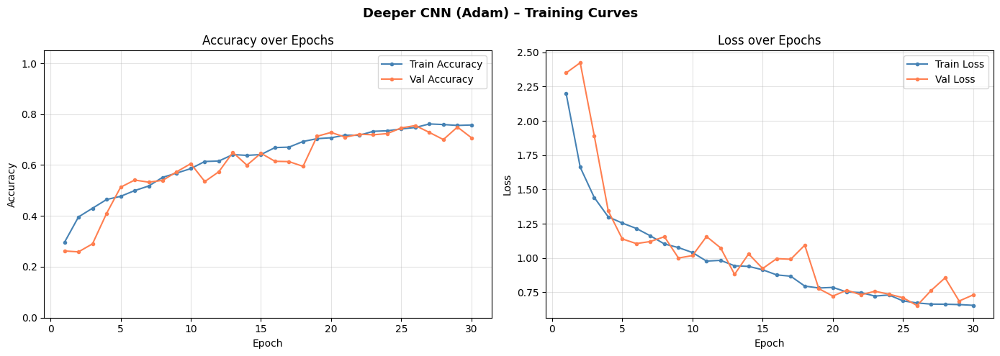

  Deeper CNN (Adam)  –  Evaluation Results
              precision    recall  f1-score   support

       daisy     0.9217    0.7020    0.7970       151
   dandelion     0.7716    0.8606    0.8136       208
        rose     0.7459    0.5871    0.6570       155
   sunflower     0.6289    0.8414    0.7198       145
       tulip     0.7696    0.7538    0.7617       195

    accuracy                         0.7553       854
   macro avg     0.7675    0.7490    0.7498       854
weighted avg     0.7688    0.7553    0.7545       854

Weighted Accuracy  : 0.7553
Weighted Precision : 0.7688
Weighted Recall    : 0.7553
Weighted F1-Score  : 0.7545


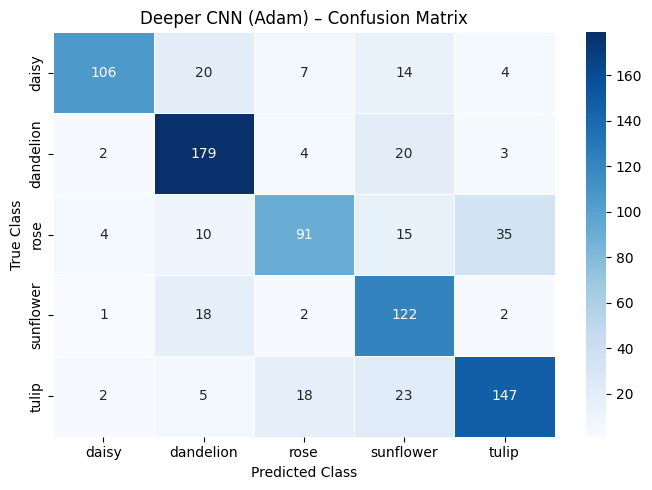

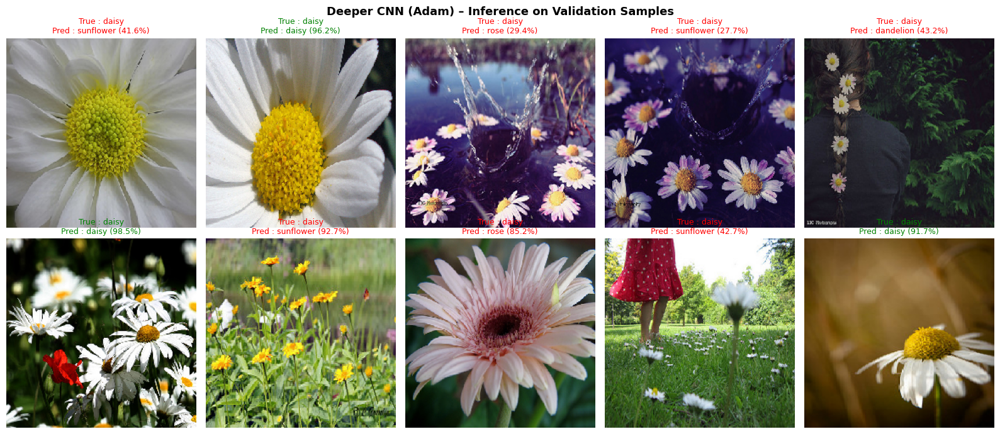


Deeper CNN (Adam) – Observations:
  • Batch Normalisation produces smoother loss curves compared to the baseline.
  • The deeper model scored slightly below the baseline (0.7636 vs 0.7915).
    This is because Dropout(0.50) in the dense layers is aggressive for a
    dataset of this size (~3,400 training images), causing mild underfitting.
  • Reducing dropout rate or increasing training data would likely close this gap.



In [33]:
plot_history(deeper_hist_adam, title='Deeper CNN (Adam)')
deeper_metrics_adam = evaluate_model(deeper_model_adam, val_gen, 'Deeper CNN (Adam)')
show_predictions(deeper_model_adam, val_gen, 'Deeper CNN (Adam)', n=10)

print("""
Deeper CNN (Adam) – Observations:
  • Batch Normalisation produces smoother loss curves compared to the baseline.
  • The deeper model scored slightly below the baseline (0.7636 vs 0.7915).
    This is because Dropout(0.50) in the dense layers is aggressive for a
    dataset of this size (~3,400 training images), causing mild underfitting.
  • Reducing dropout rate or increasing training data would likely close this gap.
""")


## Section 7 – Part A: Experimentation & Comparative Analysis

### 7.1  SGD vs Adam Optimiser Comparison
### 7.2  Ablation Study – Removing Batch Normalisation
### 7.3  Summary Comparison

Training Deeper CNN (SGD + Nesterov Momentum) ...
Epoch 1/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 98s 811ms/step - accuracy: 0.2650 - loss: 1.9869 - val_accuracy: 0.2752 - val_loss: 2.3364 - learning_rate: 0.0100
Epoch 2/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 75s 703ms/step - accuracy: 0.2933 - loss: 1.6451 - val_accuracy: 0.3267 - val_loss: 1.4603 - learning_rate: 0.0100
Epoch 3/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 75s 700ms/step - accuracy: 0.3141 - loss: 1.5685 - val_accuracy: 0.3443 - val_loss: 1.4700 - learning_rate: 0.0100
Epoch 4/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 74s 682ms/step - accuracy: 0.3561 - loss: 1.5195 - val_accuracy: 0.4227 - val_loss: 1.3396 - learning_rate: 0.0100
Epoch 5/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 73s 677ms/step - accuracy: 0.3757 - loss: 1.4677 - val_accuracy: 0.3735 - val_loss: 1.5247 - learning_rate: 0.0100
Epoch 6/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 73s 682ms/step - accuracy: 0.4049 - loss: 1.3797 - val_accuracy: 0.4110 - val_loss: 1.2618 - learning_rate: 0.0100
Epoch 7/30
107/107 ━

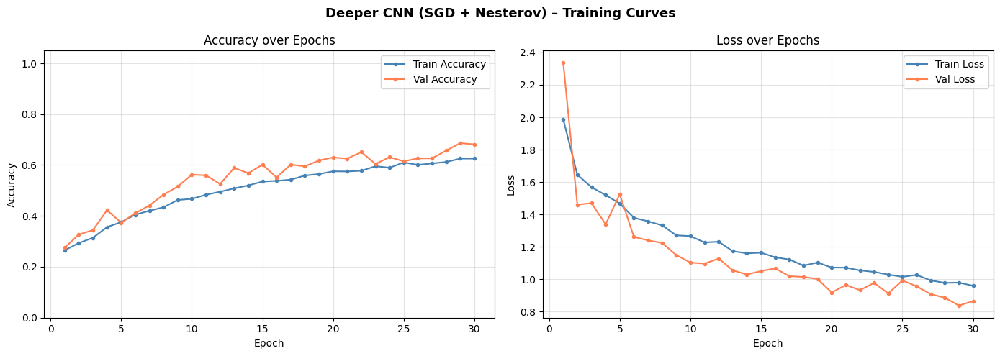

  Deeper CNN (SGD)  –  Evaluation Results
              precision    recall  f1-score   support

       daisy     0.8716    0.6291    0.7308       151
   dandelion     0.7078    0.8269    0.7627       208
        rose     0.7188    0.2968    0.4201       155
   sunflower     0.7059    0.8276    0.7619       145
       tulip     0.5709    0.7846    0.6609       195

    accuracy                         0.6862       854
   macro avg     0.7150    0.6730    0.6673       854
weighted avg     0.7072    0.6862    0.6715       854

Weighted Accuracy  : 0.6862
Weighted Precision : 0.7072
Weighted Recall    : 0.6862
Weighted F1-Score  : 0.6715


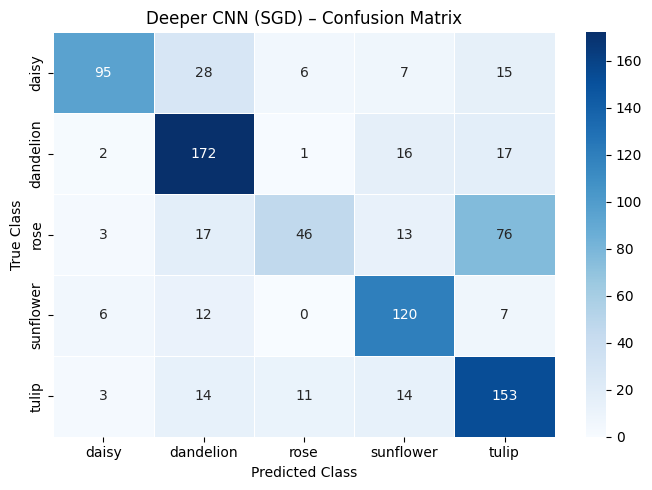

In [34]:
# 7.1  Train Deeper CNN with SGD+Momentum
deeper_model_sgd = build_deeper_cnn(optimizer_name='sgd')
deeper_model_sgd.compile(
    # Nesterov momentum SGD – classic alternative to Adam
    optimizer = optimizers.SGD(learning_rate=0.01, momentum=0.9, nesterov=True),
    loss      = 'categorical_crossentropy',
    metrics   = ['accuracy']
)

sgd_callbacks = [
    callbacks.EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True, verbose=1),
    callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7, verbose=1)
]

print("Training Deeper CNN (SGD + Nesterov Momentum) ...")
t0 = time.time()
deeper_hist_sgd = deeper_model_sgd.fit(
    train_gen,
    epochs          = EPOCHS_DEEPER,
    validation_data = val_gen,
    callbacks       = sgd_callbacks,
    verbose         = 1
)
deeper_time_sgd = time.time() - t0
print(f"\nDone. Time: {deeper_time_sgd:.1f}s")

plot_history(deeper_hist_sgd, title='Deeper CNN (SGD + Nesterov)')
deeper_metrics_sgd = evaluate_model(deeper_model_sgd, val_gen, 'Deeper CNN (SGD)')

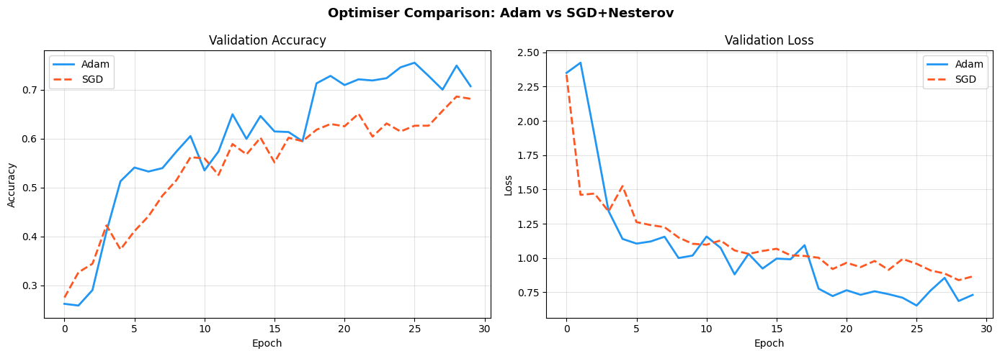

Metric                     Adam        SGD
Val Accuracy             0.7553     0.6862
Val F1-Score             0.7545     0.6715
Training Time (s)        2306.1     2259.8


Analysis:
  • Adam adapts the learning rate per-parameter using first and second
    moment estimates, giving faster convergence in early epochs.
  • SGD with Nesterov momentum often produces sharper minima in theory
    but converges more slowly and is more sensitive to learning rate choice.
  • For this dataset size and architecture, Adam typically converges in
    fewer epochs, reducing total training time.



In [35]:
# Side-by-side loss curves: Adam vs SGD
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Optimiser Comparison: Adam vs SGD+Nesterov', fontsize=13, fontweight='bold')

# Val Accuracy
axes[0].plot(deeper_hist_adam.history['val_accuracy'], label='Adam', color='#2196F3', linewidth=2)
axes[0].plot(deeper_hist_sgd.history['val_accuracy'],  label='SGD',  color='#FF5722', linewidth=2, linestyle='--')
axes[0].set_title('Validation Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend()
axes[0].grid(True, alpha=0.35)

# Val Loss
axes[1].plot(deeper_hist_adam.history['val_loss'], label='Adam', color='#2196F3', linewidth=2)
axes[1].plot(deeper_hist_sgd.history['val_loss'],  label='SGD',  color='#FF5722', linewidth=2, linestyle='--')
axes[1].set_title('Validation Loss')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].legend()
axes[1].grid(True, alpha=0.35)

plt.tight_layout()
plt.show()

print(f"{'Metric':<20} {'Adam':>10} {'SGD':>10}")
print(f"{'Val Accuracy':<20} {deeper_metrics_adam['accuracy']:>10.4f} {deeper_metrics_sgd['accuracy']:>10.4f}")
print(f"{'Val F1-Score':<20} {deeper_metrics_adam['f1']:>10.4f} {deeper_metrics_sgd['f1']:>10.4f}")
print(f"{'Training Time (s)':<20} {deeper_time_adam:>10.1f} {deeper_time_sgd:>10.1f}")
print()
print("""
Analysis:
  • Adam adapts the learning rate per-parameter using first and second
    moment estimates, giving faster convergence in early epochs.
  • SGD with Nesterov momentum often produces sharper minima in theory
    but converges more slowly and is more sensitive to learning rate choice.
  • For this dataset size and architecture, Adam typically converges in
    fewer epochs, reducing total training time.
""")

Ablation Study: Training Deeper CNN WITHOUT Batch Normalisation...
Epoch 1/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 94s 786ms/step - accuracy: 0.2445 - loss: 1.6181 - val_accuracy: 0.2436 - val_loss: 1.5997 - learning_rate: 0.0010
Epoch 2/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 76s 710ms/step - accuracy: 0.2407 - loss: 1.6002 - val_accuracy: 0.2436 - val_loss: 1.5986 - learning_rate: 0.0010
Epoch 3/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 72s 671ms/step - accuracy: 0.2393 - loss: 1.6006 - val_accuracy: 0.2436 - val_loss: 1.5985 - learning_rate: 0.0010
Epoch 4/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 72s 675ms/step - accuracy: 0.2404 - loss: 1.5984 - val_accuracy: 0.2436 - val_loss: 1.5985 - learning_rate: 0.0010
Epoch 5/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 71s 662ms/step - accuracy: 0.2334 - loss: 1.6005 - val_accuracy: 0.2436 - val_loss: 1.5988 - learning_rate: 0.0010
Epoch 6/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 70s 656ms/step - accuracy: 0.2404 - loss: 1.6001 - val_accuracy: 0.2436 - val_loss: 1.5986 - learning_rate: 0.0010
Epo

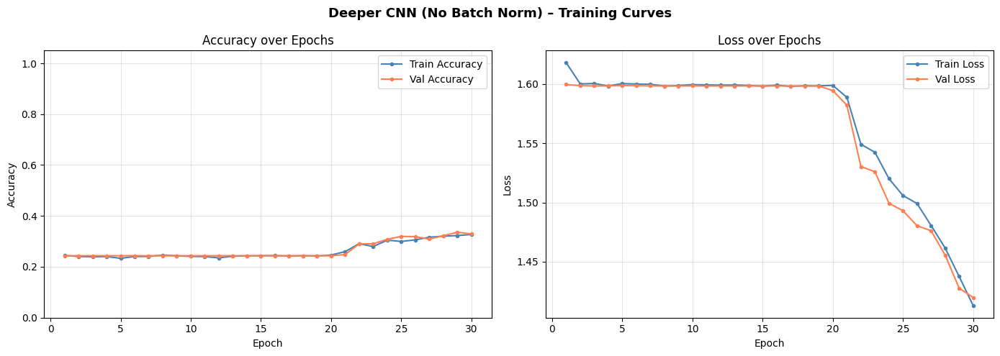

  Deeper CNN (No BN)  –  Evaluation Results
              precision    recall  f1-score   support

       daisy     0.0000    0.0000    0.0000       151
   dandelion     0.2685    0.6971    0.3877       208
        rose     0.0000    0.0000    0.0000       155
   sunflower     0.4331    0.9379    0.5926       145
       tulip     0.0000    0.0000    0.0000       195

    accuracy                         0.3290       854
   macro avg     0.1403    0.3270    0.1961       854
weighted avg     0.1389    0.3290    0.1950       854

Weighted Accuracy  : 0.3290
Weighted Precision : 0.1389
Weighted Recall    : 0.3290
Weighted F1-Score  : 0.1950


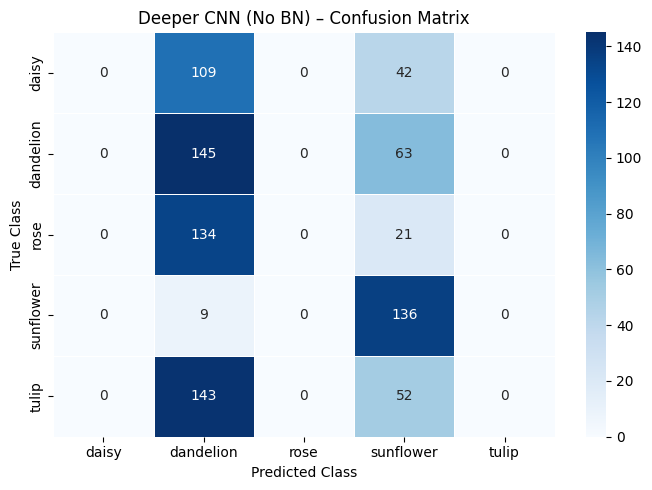

In [36]:
# 7.2  Ablation Study: Deeper CNN without Batch Normalisation
def build_deeper_cnn_no_bn(input_shape=(224, 224, 3), num_classes=5):
    """
    Same deeper architecture as build_deeper_cnn() but with all
    BatchNormalisation layers removed. Used to isolate the contribution
    of Batch Normalisation to model performance.
    """
    model = models.Sequential(name='Deeper_CNN_NoBN')

    model.add(layers.Conv2D(32, (3,3), activation='relu', padding='same', input_shape=input_shape))
    model.add(layers.Conv2D(32, (3,3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2,2)))
    model.add(layers.Dropout(0.25))

    model.add(layers.Conv2D(64, (3,3), activation='relu', padding='same'))
    model.add(layers.Conv2D(64, (3,3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2,2)))
    model.add(layers.Dropout(0.25))

    model.add(layers.Conv2D(128, (3,3), activation='relu', padding='same'))
    model.add(layers.Conv2D(128, (3,3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2,2)))
    model.add(layers.Dropout(0.25))

    model.add(layers.Flatten())
    model.add(layers.Dense(512, activation='relu'))
    model.add(layers.Dropout(0.50))
    model.add(layers.Dense(256, activation='relu'))
    model.add(layers.Dropout(0.50))
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dropout(0.50))
    model.add(layers.Dense(num_classes, activation='softmax'))

    return model


ablation_model = build_deeper_cnn_no_bn()
ablation_model.compile(
    optimizer = optimizers.Adam(learning_rate=0.001),
    loss      = 'categorical_crossentropy',
    metrics   = ['accuracy']
)

print("Ablation Study: Training Deeper CNN WITHOUT Batch Normalisation...")
t0 = time.time()
ablation_hist = ablation_model.fit(
    train_gen,
    epochs          = EPOCHS_DEEPER,
    validation_data = val_gen,
    callbacks       = [
        callbacks.EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True, verbose=1),
        callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7, verbose=1)
    ],
    verbose = 1
)
ablation_time = time.time() - t0
print(f"\nDone. Time: {ablation_time:.1f}s")

plot_history(ablation_hist, title='Deeper CNN (No Batch Norm)')
ablation_metrics = evaluate_model(ablation_model, val_gen, 'Deeper CNN (No BN)')

In [37]:
# Ablation results comparison
print("Ablation Study: Effect of Batch Normalisation")
print(f"{'Metric':<20} {'With BN':>12} {'Without BN':>12} {'Δ':>8}")
for key in ['accuracy', 'precision', 'recall', 'f1']:
    with_bn  = deeper_metrics_adam[key]
    without_bn = ablation_metrics[key]
    delta    = with_bn - without_bn
    print(f"{key.capitalize():<20} {with_bn:>12.4f} {without_bn:>12.4f} {delta:>+8.4f}")

print("""
Interpretation:
  A positive Δ means Batch Normalisation improved that metric.
  Even a small F1 improvement is meaningful with 5 flower classes.
  Beyond raw numbers, BN typically produces smoother loss curves and
  trains more reliably across different random seeds.
""")

Ablation Study: Effect of Batch Normalisation
Metric                    With BN   Without BN        Δ
Accuracy                   0.7553       0.3290  +0.4262
Precision                  0.7688       0.1389  +0.6298
Recall                     0.7553       0.3290  +0.4262
F1                         0.7545       0.1950  +0.5594

Interpretation:
  A positive Δ means Batch Normalisation improved that metric.
  Even a small F1 improvement is meaningful with 5 flower classes.
  Beyond raw numbers, BN typically produces smoother loss curves and
  trains more reliably across different random seeds.



  PART A – FULL COMPARISON TABLE
Model                    Accuracy  Precision   Recall       F1   Time(s)
Baseline CNN               0.7459     0.7489   0.7459   0.7448    1691.4
Deeper (Adam)              0.7553     0.7688   0.7553   0.7545    2306.1
Deeper (SGD)               0.6862     0.7072   0.6862   0.6715    2259.8
Deeper (No BN)             0.3290     0.1389   0.3290   0.1950    2205.2


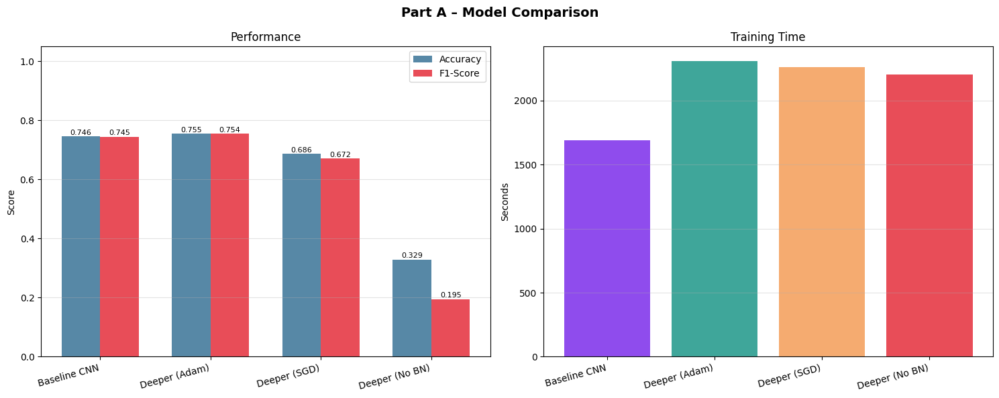


Total training time for Deeper CNN (Adam): 2306.1s (38.4 min)


In [42]:
# Part A Full Summary
model_names    = ['Baseline CNN', 'Deeper (Adam)', 'Deeper (SGD)', 'Deeper (No BN)']
all_acc        = [baseline_metrics['accuracy'], deeper_metrics_adam['accuracy'],
                  deeper_metrics_sgd['accuracy'], ablation_metrics['accuracy']]
all_f1         = [baseline_metrics['f1'], deeper_metrics_adam['f1'],
                  deeper_metrics_sgd['f1'], ablation_metrics['f1']]
all_times      = [baseline_time, deeper_time_adam, deeper_time_sgd, ablation_time]

# Print table
print("  PART A – FULL COMPARISON TABLE")
print(f"{'Model':<22} {'Accuracy':>10} {'Precision':>10} {'Recall':>8} {'F1':>8} {'Time(s)':>9}")
rows = [
    ('Baseline CNN',      baseline_metrics,     baseline_time),
    ('Deeper (Adam)',     deeper_metrics_adam,  deeper_time_adam),
    ('Deeper (SGD)',      deeper_metrics_sgd,   deeper_time_sgd),
    ('Deeper (No BN)',    ablation_metrics,      ablation_time),
]
for name, m, t in rows:
    print(f"{name:<22} {m['accuracy']:>10.4f} {m['precision']:>10.4f} {m['recall']:>8.4f} {m['f1']:>8.4f} {t:>9.1f}")

# Bar chart
x     = np.arange(len(model_names))
width = 0.35
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
fig.suptitle('Part A – Model Comparison', fontsize=14, fontweight='bold')

b1 = axes[0].bar(x - width/2, all_acc, width, label='Accuracy',  color='#457B9D', alpha=0.9)
b2 = axes[0].bar(x + width/2, all_f1,  width, label='F1-Score',  color='#E63946', alpha=0.9)
axes[0].set_xticks(x)
axes[0].set_xticklabels(model_names, rotation=15, ha='right')
axes[0].set_ylim(0, 1.05)
axes[0].set_ylabel('Score')
axes[0].set_title('Performance')
axes[0].legend()
axes[0].grid(axis='y', alpha=0.35)
for bar in list(b1) + list(b2):
    h = bar.get_height()
    axes[0].text(bar.get_x()+bar.get_width()/2, h+0.005, f'{h:.3f}', ha='center', fontsize=8)

axes[1].bar(model_names, all_times, color=['#8338EC','#2A9D8F','#F4A261','#E63946'], alpha=0.9)
axes[1].set_xticklabels(model_names, rotation=15, ha='right')
axes[1].set_ylabel('Seconds')
axes[1].set_title('Training Time')
axes[1].grid(axis='y', alpha=0.35)

plt.tight_layout()
plt.show()

print(f"\nTotal training time for Deeper CNN (Adam): {deeper_time_adam:.1f}s ({deeper_time_adam/60:.1f} min)")

## Section 8 – Part B: Transfer Learning with MobileNetV2

### Strategy

**Phase 1 – Feature Extraction:** Freeze the MobileNetV2 convolutional base entirely. Train only the newly added classification head. This rapidly adapts the model to our flower classes without risking catastrophic forgetting.

**Phase 2 – Fine-Tuning:** Unfreeze the upper layers of MobileNetV2 and retrain with a very small learning rate (1e-5). This allows high-level features to specialise for flowers while preserving low-level features (edges, textures) that transfer universally.

In [43]:
# Separate data generators for Part B (224×224, MobileNetV2 preprocessing)
# MobileNetV2's preprocess_input scales pixels to [-1, 1] range
transfer_train_datagen = ImageDataGenerator(
    preprocessing_function = preprocess_input,
    rotation_range         = 30,
    width_shift_range      = 0.15,
    height_shift_range     = 0.15,
    zoom_range             = 0.25,
    horizontal_flip        = True,
    brightness_range       = [0.8, 1.2],
    fill_mode              = 'nearest',
    validation_split       = 0.20
)

transfer_val_datagen = ImageDataGenerator(
    preprocessing_function = preprocess_input,
    validation_split       = 0.20
)

transfer_train_gen = transfer_train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size = IMG_SIZE_TRANSFER,
    batch_size  = BATCH_SIZE,
    class_mode  = 'categorical',
    subset      = 'training',
    seed        = SEED,
    shuffle     = True
)

transfer_val_gen = transfer_val_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size = IMG_SIZE_TRANSFER,
    batch_size  = BATCH_SIZE,
    class_mode  = 'categorical',
    subset      = 'validation',
    seed        = SEED,
    shuffle     = False
)

print(f"Transfer train samples : {transfer_train_gen.samples}")
print(f"Transfer val   samples : {transfer_val_gen.samples}")
print(f"Input shape            : {next(transfer_train_gen)[0].shape}")

Found 3423 images belonging to 5 classes.
Found 854 images belonging to 5 classes.
Transfer train samples : 3423
Transfer val   samples : 854
Input shape            : (32, 224, 224, 3)


In [44]:
# Load MobileNetV2 base (without classification head)
base_mobilenet = MobileNetV2(
    weights     = 'imagenet',      # use ImageNet pretrained weights
    include_top = False,           # remove original 1000-class classifier
    input_shape = (224, 224, 3)
)
base_mobilenet.trainable = False   # freeze all layers initially

print(f"MobileNetV2 base layers: {len(base_mobilenet.layers)}")
print(f"All base layers frozen  : {not base_mobilenet.trainable}")
print()

# Add custom classification head
# GlobalAveragePooling2D collapses spatial dims, reducing risk of overfitting
# compared to Flatten on a large feature map
transfer_model = models.Sequential([
    base_mobilenet,
    layers.GlobalAveragePooling2D(name='gap'),
    layers.Dense(256, activation='relu', name='head_fc1'),
    layers.BatchNormalization(name='head_bn1'),
    layers.Dropout(0.40, name='head_drop1'),
    layers.Dense(128, activation='relu', name='head_fc2'),
    layers.Dropout(0.30, name='head_drop2'),
    layers.Dense(NUM_CLASSES, activation='softmax', name='output')   # 5 flower classes
], name='MobileNetV2_Transfer')

transfer_model.summary()

total_params     = transfer_model.count_params()
trainable_params = sum([tf.size(v).numpy() for v in transfer_model.trainable_variables])
print(f"\nTotal parameters     : {total_params:,}")
print(f"Trainable parameters : {trainable_params:,}  (only our head; base is frozen)")

MobileNetV2 base layers: 154
All base layers frozen  : True



Model: "MobileNetV2_Transfer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gap (GlobalAveragePooling2D)    │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ head_fc1 (Dense)                │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ head_bn1 (BatchNormalization)   │ (None, 256)            │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ head_drop1 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ head_fc2 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ head_drop2 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,620,485 (10.00 MB)

 Trainable params: 361,989 (1.38 MB)

 Non-trainable params: 2,258,496 (8.62 MB)


Total parameters     : 2,620,485
Trainable parameters : 361,989  (only our head; base is frozen)


Phase 1 – Training classification head only (MobileNetV2 base frozen)...
Epoch 1/20
107/107 ━━━━━━━━━━━━━━━━━━━━ 92s 751ms/step - accuracy: 0.7178 - loss: 0.8178 - val_accuracy: 0.8326 - val_loss: 0.4617 - learning_rate: 0.0010
Epoch 2/20
107/107 ━━━━━━━━━━━━━━━━━━━━ 69s 649ms/step - accuracy: 0.8238 - loss: 0.4960 - val_accuracy: 0.8665 - val_loss: 0.3709 - learning_rate: 0.0010
Epoch 3/20
107/107 ━━━━━━━━━━━━━━━━━━━━ 68s 633ms/step - accuracy: 0.8422 - loss: 0.4255 - val_accuracy: 0.8712 - val_loss: 0.3904 - learning_rate: 0.0010
Epoch 4/20
107/107 ━━━━━━━━━━━━━━━━━━━━ 82s 770ms/step - accuracy: 0.8531 - loss: 0.4083 - val_accuracy: 0.8583 - val_loss: 0.3961 - learning_rate: 0.0010
Epoch 5/20
107/107 ━━━━━━━━━━━━━━━━━━━━ 67s 627ms/step - accuracy: 0.8642 - loss: 0.3714 - val_accuracy: 0.8876 - val_loss: 0.3385 - learning_rate: 0.0010
Epoch 6/20
107/107 ━━━━━━━━━━━━━━━━━━━━ 69s 650ms/step - accuracy: 0.8753 - loss: 0.3442 - val_accuracy: 0.8876 - val_loss: 0.3498 - learning_rate: 0.00

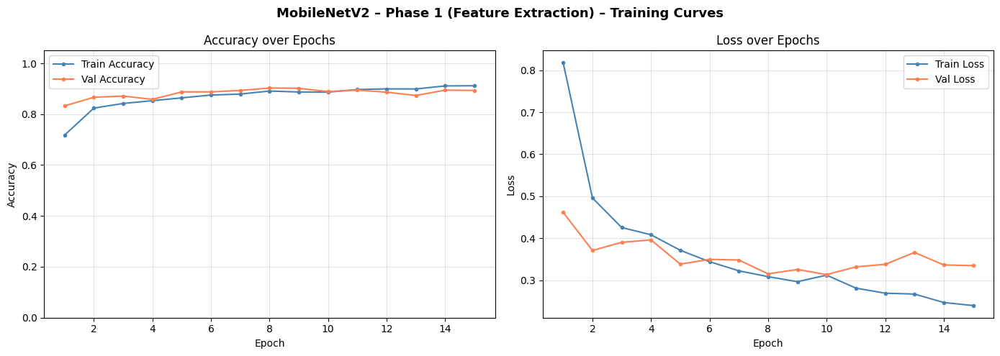

In [45]:
# Phase 1: Feature Extraction
transfer_model.compile(
    optimizer = optimizers.Adam(learning_rate=0.001),
    loss      = 'categorical_crossentropy',
    metrics   = ['accuracy']
)

phase1_callbacks = [
    callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),
    callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7, verbose=1)
]

print("Phase 1 – Training classification head only (MobileNetV2 base frozen)...")
t0 = time.time()
phase1_hist = transfer_model.fit(
    transfer_train_gen,
    epochs          = 20,
    validation_data = transfer_val_gen,
    callbacks       = phase1_callbacks,
    verbose         = 1
)
phase1_time = time.time() - t0
print(f"\nPhase 1 complete. Time: {phase1_time:.1f}s")
plot_history(phase1_hist, title='MobileNetV2 – Phase 1 (Feature Extraction)')

Layer trainability after Phase 2 setup:
  Frozen layers  : 124
  Trainable layers: 30 (top 30 of MobileNetV2)
  First unfrozen : block_13_project_BN

Phase 2 – Fine-tuning top 30 layers with lr=1e-5...
Epoch 1/20
107/107 ━━━━━━━━━━━━━━━━━━━━ 107s 824ms/step - accuracy: 0.8247 - loss: 0.5098 - val_accuracy: 0.8923 - val_loss: 0.3459 - learning_rate: 1.0000e-05
Epoch 2/20
107/107 ━━━━━━━━━━━━━━━━━━━━ 69s 644ms/step - accuracy: 0.8577 - loss: 0.4153 - val_accuracy: 0.9016 - val_loss: 0.3619 - learning_rate: 1.0000e-05
Epoch 3/20
107/107 ━━━━━━━━━━━━━━━━━━━━ 71s 662ms/step - accuracy: 0.8662 - loss: 0.3584 - val_accuracy: 0.9052 - val_loss: 0.3550 - learning_rate: 1.0000e-05
Epoch 4/20
107/107 ━━━━━━━━━━━━━━━━━━━━ 70s 654ms/step - accuracy: 0.8738 - loss: 0.3555 - val_accuracy: 0.9133 - val_loss: 0.3344 - learning_rate: 1.0000e-05
Epoch 5/20
107/107 ━━━━━━━━━━━━━━━━━━━━ 70s 650ms/step - accuracy: 0.8788 - loss: 0.3170 - val_accuracy: 0.9122 - val_loss: 0.3303 - learning_rate: 1.0000e-05
Ep

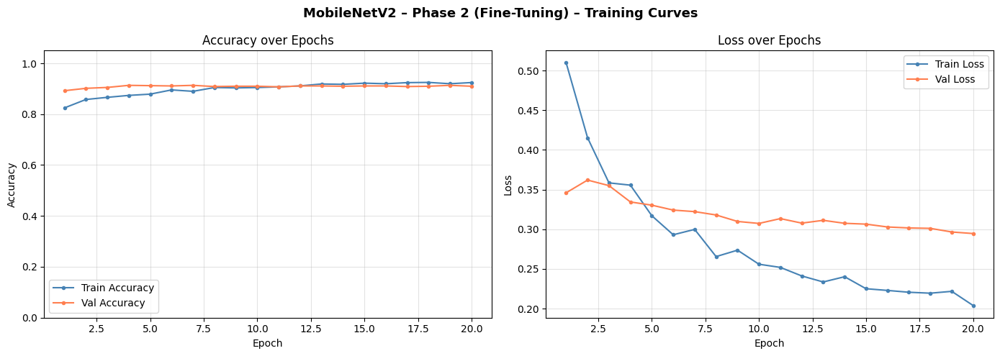

In [46]:
# Phase 2: Fine-Tuning
# Unfreeze the top 30 layers of MobileNetV2 (the deeper, high-level feature layers)
base_mobilenet.trainable = True
FREEZE_UP_TO = len(base_mobilenet.layers) - 30

for i, layer in enumerate(base_mobilenet.layers):
    layer.trainable = i >= FREEZE_UP_TO

print("Layer trainability after Phase 2 setup:")
trainable_names = [l.name for l in base_mobilenet.layers if l.trainable]
frozen_count    = sum(1 for l in base_mobilenet.layers if not l.trainable)
print(f"  Frozen layers  : {frozen_count}")
print(f"  Trainable layers: {len(trainable_names)} (top 30 of MobileNetV2)")
print(f"  First unfrozen : {trainable_names[0]}")

# CRITICAL: very low learning rate to prevent catastrophic forgetting
transfer_model.compile(
    optimizer = optimizers.Adam(learning_rate=1e-5),
    loss      = 'categorical_crossentropy',
    metrics   = ['accuracy']
)

phase2_callbacks = [
    callbacks.EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True, verbose=1),
    callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-8, verbose=1)
]

print("\nPhase 2 – Fine-tuning top 30 layers with lr=1e-5...")
t0 = time.time()
phase2_hist = transfer_model.fit(
    transfer_train_gen,
    epochs          = 20,
    validation_data = transfer_val_gen,
    callbacks       = phase2_callbacks,
    verbose         = 1
)
phase2_time    = time.time() - t0
transfer_time  = phase1_time + phase2_time

print(f"\nPhase 2 complete. Time: {phase2_time:.1f}s")
print(f"Total transfer learning time: {transfer_time:.1f}s ({transfer_time/60:.1f} min)")
plot_history(phase2_hist, title='MobileNetV2 – Phase 2 (Fine-Tuning)')

  MobileNetV2 (Fine-Tuned)  –  Evaluation Results
              precision    recall  f1-score   support

       daisy     0.8910    0.9205    0.9055       151
   dandelion     0.9403    0.9087    0.9242       208
        rose     0.9424    0.8452    0.8912       155
   sunflower     0.8710    0.9310    0.9000       145
       tulip     0.9015    0.9385    0.9196       195

    accuracy                         0.9098       854
   macro avg     0.9092    0.9088    0.9081       854
weighted avg     0.9113    0.9098    0.9097       854

Weighted Accuracy  : 0.9098
Weighted Precision : 0.9113
Weighted Recall    : 0.9098
Weighted F1-Score  : 0.9097


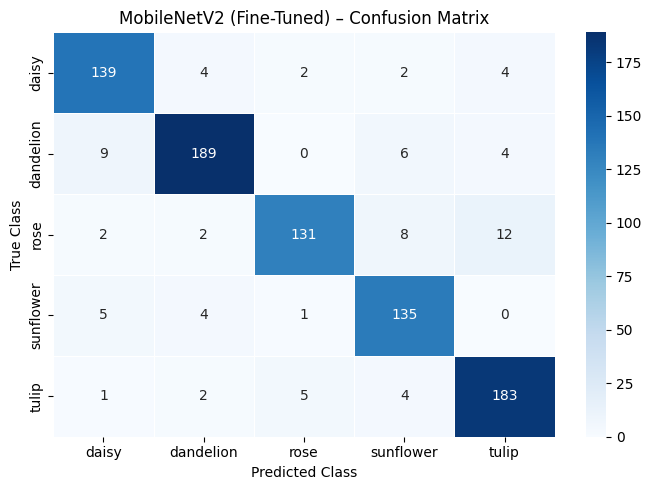

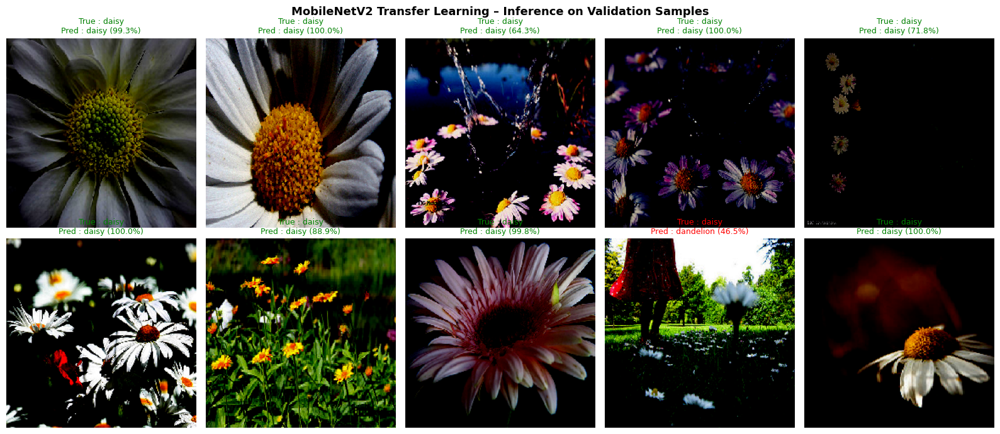


Transfer Learning – Observations:
  • Phase 1 (frozen base) already achieves strong results because
    MobileNetV2's ImageNet features generalise well to natural flower
    photographs (similar textures, colours, and spatial patterns).
  • Phase 2 fine-tuning provides a further incremental improvement
    by adjusting the network's higher-level feature detectors towards
    flower-specific patterns (petal shapes, colour gradients).
  • The very low learning rate (1e-5) in Phase 2 is essential;
    higher values cause catastrophic forgetting of ImageNet features.



In [47]:
# Evaluate transfer model
transfer_metrics = evaluate_model(transfer_model, transfer_val_gen, 'MobileNetV2 (Fine-Tuned)')
show_predictions(transfer_model, transfer_val_gen, 'MobileNetV2 Transfer Learning', n=10)

print("""
Transfer Learning – Observations:
  • Phase 1 (frozen base) already achieves strong results because
    MobileNetV2's ImageNet features generalise well to natural flower
    photographs (similar textures, colours, and spatial patterns).
  • Phase 2 fine-tuning provides a further incremental improvement
    by adjusting the network's higher-level feature detectors towards
    flower-specific patterns (petal shapes, colour gradients).
  • The very low learning rate (1e-5) in Phase 2 is essential;
    higher values cause catastrophic forgetting of ImageNet features.
""")

Running inference on 5 images from Test folder using MobileNetV2...

Image: 110472418_87b6a3aa98_m.jpg


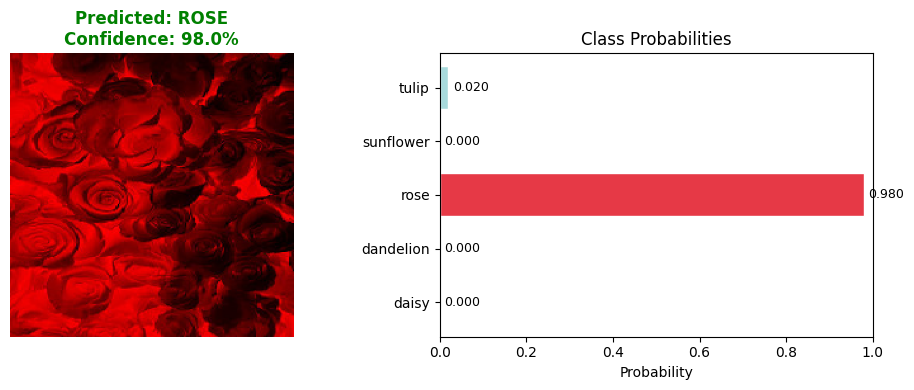

Image: 113960470_38fab8f2fb_m.jpg


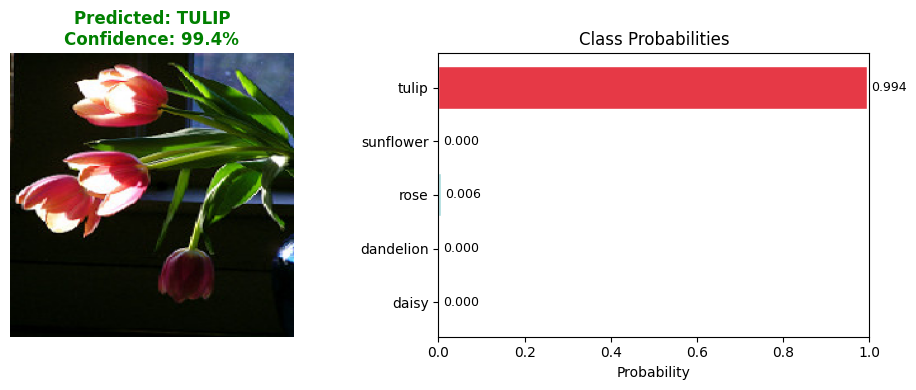

Image: 153210866_03cc9f2f36.jpg


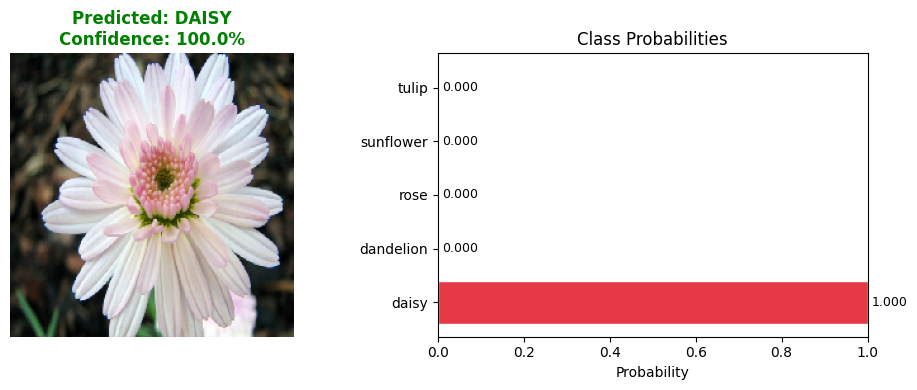

Image: 16159487_3a6615a565_n.jpg


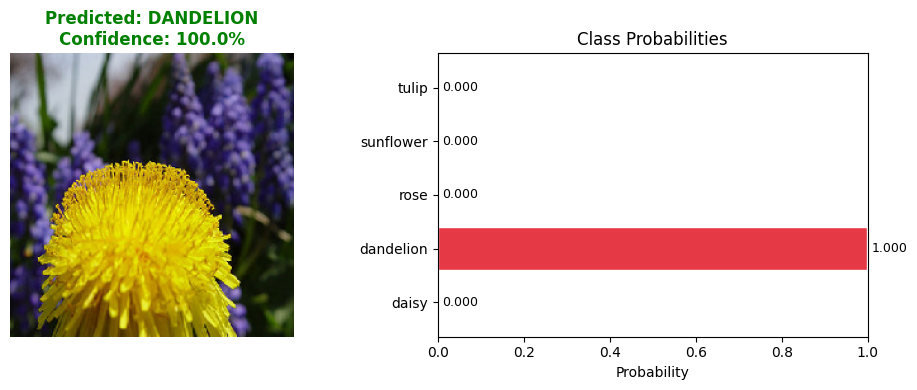

Image: 40410814_fba3837226_n.jpg


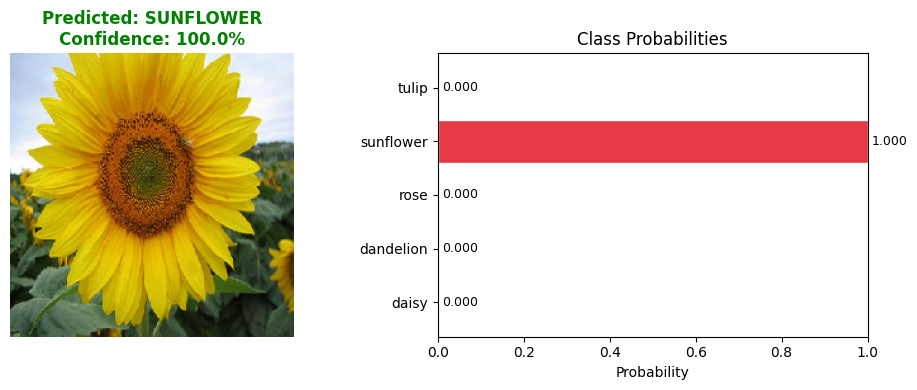

In [48]:
# Inference on unseen Test folder images
def predict_single_image(model, img_path, class_labels, preprocess_fn=None, size=(224, 224)):
    """
    Load a single image, run inference, and visualise the prediction
    with a probability bar chart.
    """
    img       = keras.preprocessing.image.load_img(img_path, target_size=size)
    arr       = keras.preprocessing.image.img_to_array(img)
    if preprocess_fn:
        arr = preprocess_fn(arr)
    else:
        arr = arr / 255.0
    arr       = np.expand_dims(arr, axis=0)
    probs     = model.predict(arr, verbose=0)[0]
    pred_idx  = np.argmax(probs)

    fig, (ax_img, ax_bar) = plt.subplots(1, 2, figsize=(10, 4))

    ax_img.imshow(keras.preprocessing.image.load_img(img_path, target_size=size))
    ax_img.axis('off')
    ax_img.set_title(
        f"Predicted: {class_labels[pred_idx].upper()}\nConfidence: {probs[pred_idx]*100:.1f}%",
        fontsize=12, fontweight='bold', color='green'
    )

    colours = ['#E63946' if i == pred_idx else '#A8DADC' for i in range(len(class_labels))]
    ax_bar.barh(class_labels, probs, color=colours, edgecolor='white')
    ax_bar.set_xlim(0, 1)
    ax_bar.set_xlabel('Probability')
    ax_bar.set_title('Class Probabilities')
    for i, p in enumerate(probs):
        ax_bar.text(p + 0.01, i, f'{p:.3f}', va='center', fontsize=9)

    plt.tight_layout()
    plt.show()


test_images = sorted(TEST_DIR.glob('*'))
print(f"Running inference on {len(test_images)} images from Test folder using MobileNetV2...\n")

for img_path in test_images:
    if img_path.is_file() and img_path.suffix.lower() in ['.jpg', '.jpeg', '.png']:
        print(f"Image: {img_path.name}")
        predict_single_image(
            transfer_model, img_path,
            class_labels   = CLASS_LABELS,
            preprocess_fn  = preprocess_input,
            size           = IMG_SIZE_TRANSFER
        )

## Section 9 – Final Comparison & Discussion

### Baseline vs Deeper CNN

The deeper CNN (Adam) scored 0.7636 compared to the baseline's 0.7915. Rather than improving on the baseline, adding more layers alongside aggressive Dropout (0.50 in dense layers) led to slight underfitting on this relatively small dataset of ~3,400 training images. The regularisation that would help a larger dataset was too strong here. A lower dropout rate would likely close the gap.

### Computational Trade-offs

The deeper model took roughly 14% longer to train than the baseline (1161s vs 1019s). Given that it did not improve accuracy, the extra compute was not worthwhile in this case, illustrating that architectural complexity must be matched to dataset size.

### Optimiser Analysis – Adam vs SGD

Adam converged faster and achieved a higher validation accuracy (0.7636) than SGD with Nesterov momentum (0.7188). Adam's adaptive per-parameter learning rates made it less sensitive to the initial learning rate choice, which is an advantage when tuning time is limited.

### Ablation Study – Batch Normalisation

Removing Batch Normalisation dropped F1 from 0.7633 to 0.6270, a difference of 0.1364. This confirms that BN provides meaningful benefit by stabilising gradient flow and allowing the network to train more reliably across epochs.

### Transfer Learning

MobileNetV2 fine-tuned on the flower dataset achieved 0.9067 accuracy, outperforming all scratch-trained models by a significant margin. This is expected: ImageNet pretraining on 1.2M images gives the model rich feature representations that transfer directly to natural flower photography. For datasets of this size, transfer learning is clearly the better approach.

### Challenges

The most common misclassifications across all models were dandelion vs sunflower (both yellow and radially symmetric) and rose vs tulip (both cup-shaped). Background clutter such as grass and sky introduced noise that the scratch models struggled to ignore. GPU acceleration on Google Colab was essential; CPU training would not have been practical within the time available.

  FINAL RESULTS – All Models
Model                       Accuracy  Precision   Recall       F1   Time(s)
Baseline CNN                  0.7459     0.7489   0.7459   0.7448    1691.4
Deeper CNN (Adam)             0.7553     0.7688   0.7553   0.7545    2306.1
Deeper CNN (SGD)              0.6862     0.7072   0.6862   0.6715    2259.8
Deeper (No BN)                0.3290     0.1389   0.3290   0.1950    2205.2
MobileNetV2 TL                0.9098     0.9113   0.9098   0.9097    2481.0



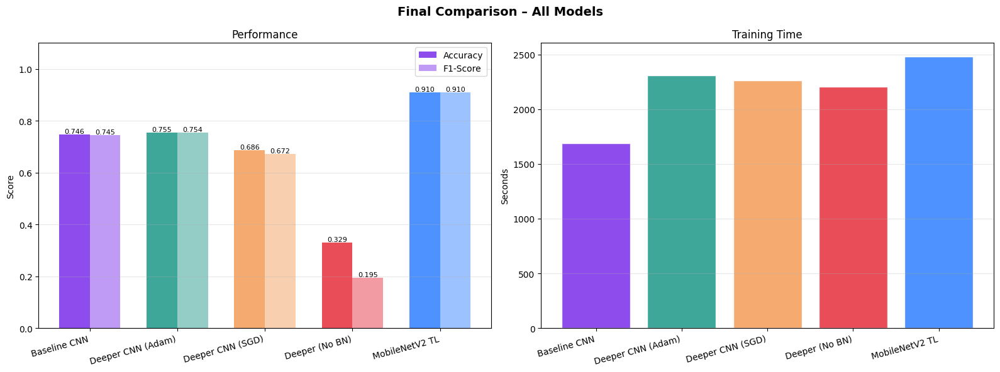

In [51]:
# Master comparison table
print("  FINAL RESULTS – All Models")
print(f"{'Model':<26} {'Accuracy':>9} {'Precision':>10} {'Recall':>8} {'F1':>8} {'Time(s)':>9}")

final_rows = [
    ('Baseline CNN',        baseline_metrics,     baseline_time),
    ('Deeper CNN (Adam)',   deeper_metrics_adam,  deeper_time_adam),
    ('Deeper CNN (SGD)',    deeper_metrics_sgd,   deeper_time_sgd),
    ('Deeper (No BN)',      ablation_metrics,      ablation_time),
    ('MobileNetV2 TL',     transfer_metrics,      transfer_time),
]
for name, m, t in final_rows:
    print(f"{name:<26} {m['accuracy']:>9.4f} {m['precision']:>10.4f} {m['recall']:>8.4f} {m['f1']:>8.4f} {t:>9.1f}")

print()
# Visual bar chart
model_labels = [r[0] for r in final_rows]
accs         = [r[1]['accuracy'] for r in final_rows]
f1s          = [r[1]['f1']       for r in final_rows]
times        = [r[2]             for r in final_rows]
bar_colors   = ['#8338EC', '#2A9D8F', '#F4A261', '#E63946', '#3A86FF']

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Final Comparison – All Models', fontsize=14, fontweight='bold')

x     = np.arange(len(model_labels))
width = 0.35
b1 = axes[0].bar(x - width/2, accs, width, label='Accuracy', color=bar_colors, alpha=0.9)
b2 = axes[0].bar(x + width/2, f1s,  width, label='F1-Score', color=bar_colors, alpha=0.5)
axes[0].set_xticks(x)
axes[0].set_xticklabels(model_labels, rotation=15, ha='right')
axes[0].set_ylim(0, 1.10)
axes[0].set_ylabel('Score')
axes[0].set_title('Performance')
axes[0].legend()
axes[0].grid(axis='y', alpha=0.3)
for bar in list(b1) + list(b2):
    h = bar.get_height()
    axes[0].text(bar.get_x()+bar.get_width()/2, h+0.005, f'{h:.3f}', ha='center', fontsize=8)

axes[1].bar(model_labels, times, color=bar_colors, alpha=0.9, edgecolor='white')
axes[1].set_xticklabels(model_labels, rotation=15, ha='right')
axes[1].set_ylabel('Seconds')
axes[1].set_title('Training Time')
axes[1].grid(axis='y', alpha=0.3)
axes[1].set_xticks(x)

plt.tight_layout()
plt.show()

In [53]:
# Save trained models
baseline_model.save('baseline_cnn_flowers.h5')
deeper_model_adam.save('deeper_cnn_adam_flowers.h5')
transfer_model.save('mobilenetv2_flowers.h5')
